# EDA Geospatial Data — Clean & Fixed Version

_Diperbarui: 2025-08-11 15:26:15_

Notebook ini telah dibersihkan dan ditambahkan **catatan Markdown** serta **perbaikan umum** untuk error yang sering muncul pada analisis geospasial (GeoPandas/Folium).  
Perubahan utama:
- Penambahan deskripsi analisis (ringkasan, langkah-langkah, dan catatan perbaikan).
- Patch fungsi pewarnaan (mengatasi `NaN` pada normalisasi).
- Perbaikan pembuatan kolom `geometry` agar `.explore()` berjalan.
- Penjagaan (guard) untuk nilai kosong/tipe tidak sesuai.

> Jalankan sel-sel dari atas ke bawah. Jika ada file yang tidak ditemukan, baca bagian **Catatan Perbaikan** di bawah untuk menyesuaikan path dataset.


> **v4c patches**: OSM URL fixed, center via `total_bounds` (no CRS centroid warning), closed polygon rings, and layer toggles (`show_pu`, `show_do`).

## Ringkasan Isi
1. **Imports & Konfigurasi**
2. **Muat Data & Pemeriksaan Awal**
3. **Pembersihan Data (handling NaN/tipe)**
4. **Rekayasa Geometri & CRS**
5. **Eksplorasi Spasial (peta `.explore()`)**
6. **Visualisasi & Insight**
7. **Kesimpulan Singkat & Next Steps**
8. **Catatan Perbaikan**


## 1) Imports & Konfigurasi
Pada bagian ini, kita memuat library utama untuk analisis geospasial: **pandas**, **geopandas**, **shapely**, dan jika diperlukan **folium**/**kepler.gl** untuk pemetaan interaktif.


In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import Point
from sqlalchemy import create_engine
from dotenv import load_dotenv
import os

In [2]:
#LOAD DATASET USING SQL QUERY
load_dotenv()
engine = create_engine(os.getenv("SUPABASE_DB_URL"))

## 2) Muat Data & Pemeriksaan Awal
- Memuat dataset trip/POI/boundary (sesuaikan path bila perlu).
- Melihat **jumlah baris/kolom**, contoh data (head), dan **tipe data**.
- Mengecek **nilai kosong (NaN)** dan anomali dasar (mis. koordinat di luar rentang).


In [3]:
with engine.connect() as conn:
    df_avg_trip = pd.read_sql("""WITH completed_trips AS (
  SELECT
        t.trip_id,
        t.pickup_datetime,
        t.dropoff_datetime,
        t.pickup_latitude,
        t.pickup_longitude,
        t.dropoff_latitude,
        t.dropoff_longitude,
        t.distance_km,
        t.duration_minutes,
        t.vehicle_type,
        t.fare_amount,
        t.surge_multiplier,

        -- Join ke admin boundary
        pup."NAME_4" AS pickup_admin,
        dof."NAME_4" AS dropoff_admin,

        -- Join ke geohash grid
        p.geohash_list AS pickup_geohash,
        d.geohash_list AS dropoff_geohash

    FROM
        jakarta_ride_trips AS t

    -- Join ke admin kelurahan untuk pickup
    LEFT JOIN id_adm_4 AS pup
        ON ST_Contains(
            pup.geometry,
            ST_SetSRID(ST_Point(t.pickup_longitude, t.pickup_latitude), 4326)
        )

    -- Join ke admin kelurahan untuk dropoff
    LEFT JOIN id_adm_4 AS dof
        ON ST_Contains(
            dof.geometry,
            ST_SetSRID(ST_Point(t.dropoff_longitude, t.dropoff_latitude), 4326)
        )

    -- Join ke geohash area pickup
    LEFT JOIN id_jkt_geohash7 AS p
        ON ST_Intersects(
            p.geometry,
            ST_SetSRID(ST_Point(t.pickup_longitude, t.pickup_latitude), 4326)
        )

    -- Join ke geohash area dropoff
    LEFT JOIN id_jkt_geohash7 AS d
        ON ST_Intersects(
            d.geometry,
            ST_SetSRID(ST_Point(t.dropoff_longitude, t.dropoff_latitude), 4326)
        )

)
SELECT * FROM completed_trips""",conn)
    df_admin_jkt = pd.read_sql("""
SELECT 
  "NAME_1",
  "NAME_2",
  "NAME_3",
  "NAME_4",
  ST_AsText(geometry) AS wkt_geom
FROM 
  id_adm_4
WHERE
  "NAME_1" in ('Jakarta Raya')""",conn)

## 3) Pembersihan Data
Langkah umum yang dilakukan:
- **Konversi tipe data** (tanggal, numerik).
- **Mengisi / menghapus NaN** sesuai konteks analisis.
- Menstandarkan nama kolom penting, misalnya: `pickup_longitude`, `pickup_latitude`, `jumlah_trip`.


In [4]:
df_admin_jkt.head()

,NAME_1,NAME_2,NAME_3,NAME_4,wkt_geom
0,Jakarta Raya,Jakarta Selatan,Setiabudi,Kuningan Timur,MULTIPOLYGON(((106.83233642600004 -6.240016936...
1,Jakarta Raya,Jakarta Selatan,Setiabudi,Menteng Atas,MULTIPOLYGON(((106.83046722400007 -6.210614203...
2,Jakarta Raya,Jakarta Selatan,Tebet,Bukit Duri,MULTIPOLYGON(((106.86355590700003 -6.225083349...
3,Jakarta Raya,Jakarta Selatan,Tebet,Kebon Baru,MULTIPOLYGON(((106.86249542200011 -6.243099211...
4,Jakarta Raya,Jakarta Selatan,Tebet,Manggarai,MULTIPOLYGON(((106.84815216000015 -6.207920072...


## 4) Rekayasa Geometri & CRS
- Membuat **GeoDataFrame** dari koordinat longitude/latitude.
- Menetapkan **CRS = EPSG:4326** (WGS84).
- (Opsional) Proyeksi ulang ke CRS metrik untuk operasi spasial tertentu.


In [5]:
df_avg_trip.head()

,trip_id,pickup_datetime,dropoff_datetime,pickup_latitude,pickup_longitude,dropoff_latitude,dropoff_longitude,distance_km,duration_minutes,vehicle_type,fare_amount,surge_multiplier,pickup_admin,dropoff_admin,pickup_geohash,dropoff_geohash
0,1,2024-01-01 00:00:00+00:00,2024-01-01 00:15:00+00:00,-6.225092,106.798409,-6.225272,106.824918,8.46,28.7,premium_car,39951.0,1.71,Gelora,Kuningan Timur,qqguw6b,qqguwfe
1,2,2024-01-01 00:03:00+00:00,2024-01-01 00:18:00+00:00,-6.109857,106.818359,-6.233418,106.886687,3.67,44.8,premium_car,40325.0,1.46,None,Cipinang Muara,None,qquh830
2,3,2024-01-01 00:06:00+00:00,2024-01-01 00:21:00+00:00,-6.153601,106.913637,-6.264769,106.840667,2.10,15.0,premium_car,34813.0,1.46,Pegangsaan Dua,Kalibata,qquhbzu,qqgur5w
3,4,2024-01-01 00:09:00+00:00,2024-01-01 00:24:00+00:00,-6.180268,106.785001,-6.178547,106.720826,3.62,40.2,car,10623.0,1.26,Tanjung Duren Selatan,Duri Kosambi,qqguvfy,qqguu7p
4,5,2024-01-01 00:12:00+00:00,2024-01-01 00:27:00+00:00,-6.268796,106.917412,-6.204675,106.746395,14.43,27.4,motorcycle,67118.0,2.22,Jatiwaringin,Srengseng,None,qqgutn6


## 6) Visualisasi & Insight
Contoh insight yang biasanya ditampilkan:
- Sebaran pickup/hotspot.
- Rata-rata jumlah trip per area/waktu.
- Keterkaitan lokasi POI dengan densitas trip.


## 📊 A. Statistik Deskriptif & Distribusi 

## 7) Kesimpulan Singkat & Next Steps
- Ringkas poin temuan terbesar dari EDA ini (hotspot utama, anomali data, kebutuhan data tambahan).
- **Next steps**: agregasi per grid/hex, feature engineering (waktu/hari/cuaca), dan evaluasi zona pickup kandidat.


**Tujuan: Memahami pola umum dari variabel numerik seperti:**

- fare_amount: distribusi harga perjalanan

- duration_minutes: durasi perjalanan

- distance_km: jarak perjalanan

## 8) Catatan Perbaikan
**Perbaikan yang diterapkan di notebook ini:**
- Fungsi warna `to_rgb_red_high_green_low` kini aman untuk nilai **NaN** dan rentang `vmin==vmax`.
- Pembuatan geometri tidak lagi menaruh `GeoDataFrame` ke dalam kolom DataFrame; sekarang dibuat sebagai **GeoDataFrame** penuh lalu `rename_geometry('pickup_geom')`.
- Ditambahkan pengingat untuk memastikan objek adalah **GeoDataFrame** sebelum memanggil `.explore()`.

> Jika error **FileNotFoundError** muncul, sesuaikan **path dataset** pada sel pemuatan data sesuai struktur project Anda.


**Dasar Teori:**

1. Statistik deskriptif membantu mengidentifikasi outlier, distribusi skewed, dan nilai-nilai dominan.

2. Referensi: "Data Science for Business" by Foster Provost & Tom Fawcett

**Visualisasi**

In [6]:
df_avg_trip[['fare_amount', 'duration_minutes', 'distance_km']].describe()

,fare_amount,duration_minutes,distance_km
count,5000.000000,5000.000000,5000.000000
mean,44934.523600,27.390880,8.411424
std,20253.734608,10.057423,3.738313
min,10001.000000,10.000000,2.000000
25%,27475.250000,18.600000,5.150000
50%,44480.000000,27.500000,8.430000
75%,62803.750000,35.900000,11.630000
max,79998.000000,45.000000,15.000000


array([[<Axes: title={'center': 'fare_amount'}>,
        <Axes: title={'center': 'duration_minutes'}>],
       [<Axes: title={'center': 'distance_km'}>, <Axes: >]], dtype=object)

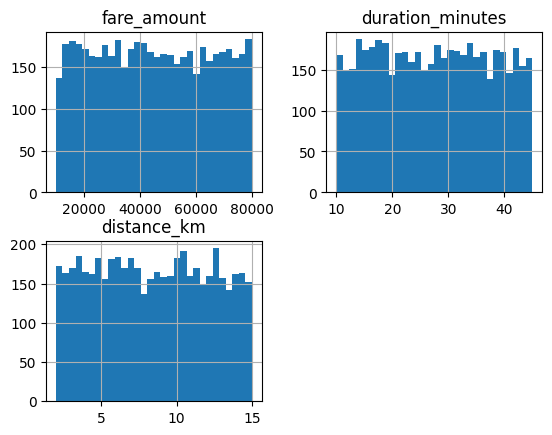

In [7]:
df_avg_trip[['fare_amount', 'duration_minutes', 'distance_km']].hist(bins=30)

### A.1 🧮 Statistik Deskriptif yang Umum Digunakan

### 📘 1. Central Tendency (Tendensi Sentral)
- Mean (rata-rata): menunjukkan nilai tengah rata-rata, bisa bias jika ada outlier.

- Median (nilai tengah): lebih robust terhadap outlier.

- Mode (nilai paling sering muncul): jika data bersifat kategorikal atau diskret.

In [8]:
df_avg_trip[['fare_amount', 'distance_km', 'duration_minutes']].mean()

fare_amount         44934.523600
distance_km             8.411424
duration_minutes       27.390880
dtype: float64

In [9]:
df_avg_trip[['fare_amount', 'distance_km', 'duration_minutes']].median()

fare_amount         44480.00
distance_km             8.43
duration_minutes       27.50
dtype: float64

### 📘 2. Dispersion (Sebaran)
- Standard deviation: mengukur variasi data dari rata-rata.

- Range (min–max): sebaran kasar.

- Interquartile range (IQR): range antara Q1 (25%) dan Q3 (75%).

In [10]:
df_avg_trip.describe()

,trip_id,pickup_latitude,pickup_longitude,dropoff_latitude,dropoff_longitude,distance_km,duration_minutes,fare_amount,surge_multiplier
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2500.500000,-6.200634,106.822872,-6.199725,106.826921,8.411424,27.390880,44934.523600,1.742446
std,1443.520003,0.057927,0.071404,0.058154,0.071952,3.738313,10.057423,20253.734608,0.433695
min,1.000000,-6.299998,106.700013,-6.299968,106.700063,2.000000,10.000000,10001.000000,1.000000
25%,1250.750000,-6.251227,106.761786,-6.250567,106.765682,5.150000,18.600000,27475.250000,1.360000
50%,2500.500000,-6.199998,106.821493,-6.200761,106.828112,8.430000,27.500000,44480.000000,1.740000
75%,3750.250000,-6.150380,106.883343,-6.147876,106.887776,11.630000,35.900000,62803.750000,2.120000
max,5000.000000,-6.100056,106.949876,-6.100039,106.949981,15.000000,45.000000,79998.000000,2.500000


### 📘 3. Skewness & Kurtosis
Skewness: apakah distribusi condong ke kiri/kanan.

Kurtosis: apakah distribusi memiliki puncak tinggi atau lebar.

In [11]:
df_avg_trip[['fare_amount', 'duration_minutes', 'distance_km']].skew()

fare_amount         0.027193
duration_minutes    0.015846
distance_km         0.025813
dtype: float64

In [12]:
df_avg_trip[['fare_amount', 'duration_minutes', 'distance_km']].kurt()

fare_amount        -1.205013
duration_minutes   -1.197091
distance_km        -1.200928
dtype: float64

### A.2 ⏱️ Analisis Temporal

**Tujuan:** Mengamati distribusi pickup berdasarkan waktu (misalnya jam, hari)

**Syarat:** Kolom pickup_datetime harus tersedia.

**Dasar Teori:**

1. Ride-hailing demand biasanya bersifat temporal (jam sibuk, weekend).

2. Referensi: "Temporal analysis of ride-hailing services" - Wang et al., 2020

<Axes: xlabel='duration_minutes', ylabel='count'>

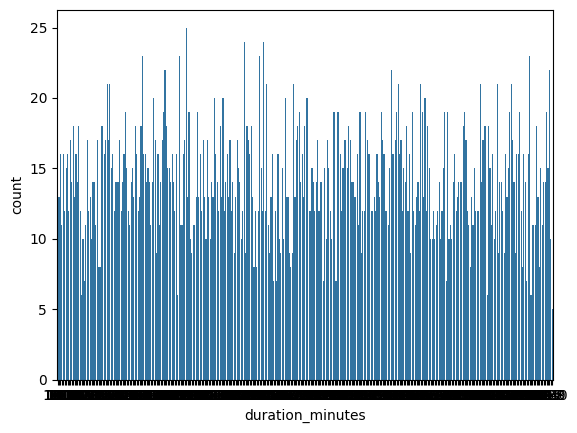

In [13]:
sns.countplot(x='duration_minutes',data=df_avg_trip)

### HARUS DIUBAH KE HOUR!!!!

## A.3 🌍 Insight Spasial

**Tujuan:** Menunjukkan distribusi pickup secara geografis

**Dasar Teori:**

1. Pola pickup cenderung mengelompok di pusat kota, terminal, pusat bisnis.

2. Referensi: "Understanding urban mobility patterns using spatial clustering" - Yuan et al.

In [14]:
from shapely import wkt

In [15]:
df_admin_jkt['wkt_geom'] = df_admin_jkt['wkt_geom'].apply(wkt.loads)

In [16]:
gdf_admin = gpd.GeoDataFrame(df_admin_jkt, geometry='wkt_geom', crs='EPSG:4326')

#### 1. PICKUP ZONE CLUSTERING ANALYSIS

Hitung jumlah pickup per area admin level 4

In [17]:
df_avg_trip.groupby('pickup_admin')['trip_id'].count().reset_index(name='pickup_trip_count').sort_values(by='pickup_trip_count', ascending=False)

,pickup_admin,pickup_trip_count
67,Halim Perdana Kusumah,100
96,Kamal Muara,78
102,Kapuk Muara,77
132,Kelapa Gading Barat,74
0,Ancol,69
...,...,...
268,Taman Sari,2
115,Kebagusan,1
59,Gondrong,1
99,Kampung Rawa,1


Hitung jumlah pickup per area admin level 4 dan diklasifikasikan berdasarkan type kendaraan

Hitung jumlah dropoff per area admin level 4

In [19]:
df_avg_trip.groupby('dropoff_admin')['trip_id'].count().reset_index(name='dropoff_trip_count').sort_values(by='dropoff_trip_count', ascending=False)

,dropoff_admin,dropoff_trip_count
67,Halim Perdana Kusumah,116
101,Kapuk Muara,77
0,Ancol,76
96,Kamal Muara,62
278,Tegal Alur,62
...,...,...
283,Ujung Menteng,2
59,Gondrong,1
48,Duri Selatan,1
63,Guntur,1


Hitung jumlah dropoff per area admin level 4 dan diklasifikasikan berdasarkan type kendaraan

In [21]:
df_avg_trip['pickup_geom'] = gpd.points_from_xy(df_avg_trip.pickup_longitude, df_avg_trip.pickup_latitude,crs="EPSG:4326")

In [22]:
df_avg_trip['dropoff_geom'] = gpd.points_from_xy(df_avg_trip.dropoff_longitude, df_avg_trip.dropoff_latitude,crs="EPSG:4326")

In [23]:
df_avg_trip.head()

,trip_id,pickup_datetime,dropoff_datetime,pickup_latitude,pickup_longitude,dropoff_latitude,dropoff_longitude,distance_km,duration_minutes,vehicle_type,fare_amount,surge_multiplier,pickup_admin,dropoff_admin,pickup_geohash,dropoff_geohash,pickup_geom,dropoff_geom
0,1,2024-01-01 00:00:00+00:00,2024-01-01 00:15:00+00:00,-6.225092,106.798409,-6.225272,106.824918,8.46,28.7,premium_car,39951.0,1.71,Gelora,Kuningan Timur,qqguw6b,qqguwfe,POINT (106.79841 -6.22509),POINT (106.82492 -6.22527)
1,2,2024-01-01 00:03:00+00:00,2024-01-01 00:18:00+00:00,-6.109857,106.818359,-6.233418,106.886687,3.67,44.8,premium_car,40325.0,1.46,None,Cipinang Muara,None,qquh830,POINT (106.81836 -6.10986),POINT (106.88669 -6.23342)
2,3,2024-01-01 00:06:00+00:00,2024-01-01 00:21:00+00:00,-6.153601,106.913637,-6.264769,106.840667,2.10,15.0,premium_car,34813.0,1.46,Pegangsaan Dua,Kalibata,qquhbzu,qqgur5w,POINT (106.91364 -6.1536),POINT (106.84067 -6.26477)
3,4,2024-01-01 00:09:00+00:00,2024-01-01 00:24:00+00:00,-6.180268,106.785001,-6.178547,106.720826,3.62,40.2,car,10623.0,1.26,Tanjung Duren Selatan,Duri Kosambi,qqguvfy,qqguu7p,POINT (106.785 -6.18027),POINT (106.72083 -6.17855)
4,5,2024-01-01 00:12:00+00:00,2024-01-01 00:27:00+00:00,-6.268796,106.917412,-6.204675,106.746395,14.43,27.4,motorcycle,67118.0,2.22,Jatiwaringin,Srengseng,None,qqgutn6,POINT (106.91741 -6.2688),POINT (106.7464 -6.20468)


In [24]:
gdf_pickup =  gpd.GeoDataFrame(df_avg_trip, geometry='pickup_geom', crs="EPSG:4326")
gdf_dropoff =  gpd.GeoDataFrame(df_avg_trip, geometry='dropoff_geom', crs="EPSG:4326")

In [25]:
gdf_pickup.head()

,trip_id,pickup_datetime,dropoff_datetime,pickup_latitude,pickup_longitude,dropoff_latitude,dropoff_longitude,distance_km,duration_minutes,vehicle_type,fare_amount,surge_multiplier,pickup_admin,dropoff_admin,pickup_geohash,dropoff_geohash,pickup_geom,dropoff_geom
0,1,2024-01-01 00:00:00+00:00,2024-01-01 00:15:00+00:00,-6.225092,106.798409,-6.225272,106.824918,8.46,28.7,premium_car,39951.0,1.71,Gelora,Kuningan Timur,qqguw6b,qqguwfe,POINT (106.79841 -6.22509),POINT (106.82492 -6.22527)
1,2,2024-01-01 00:03:00+00:00,2024-01-01 00:18:00+00:00,-6.109857,106.818359,-6.233418,106.886687,3.67,44.8,premium_car,40325.0,1.46,None,Cipinang Muara,None,qquh830,POINT (106.81836 -6.10986),POINT (106.88669 -6.23342)
2,3,2024-01-01 00:06:00+00:00,2024-01-01 00:21:00+00:00,-6.153601,106.913637,-6.264769,106.840667,2.10,15.0,premium_car,34813.0,1.46,Pegangsaan Dua,Kalibata,qquhbzu,qqgur5w,POINT (106.91364 -6.1536),POINT (106.84067 -6.26477)
3,4,2024-01-01 00:09:00+00:00,2024-01-01 00:24:00+00:00,-6.180268,106.785001,-6.178547,106.720826,3.62,40.2,car,10623.0,1.26,Tanjung Duren Selatan,Duri Kosambi,qqguvfy,qqguu7p,POINT (106.785 -6.18027),POINT (106.72083 -6.17855)
4,5,2024-01-01 00:12:00+00:00,2024-01-01 00:27:00+00:00,-6.268796,106.917412,-6.204675,106.746395,14.43,27.4,motorcycle,67118.0,2.22,Jatiwaringin,Srengseng,None,qqgutn6,POINT (106.91741 -6.2688),POINT (106.7464 -6.20468)


### Agregasi Jumlah Pickup dan Dropoff per Zona Administratif

In [45]:
pickup_agg = df_avg_trip.groupby('pickup_admin').agg(
    jumlah_trip=('trip_id', 'count'),
    rata_tarif=('fare_amount', 'mean'),
    rata_durasi=('duration_minutes', 'mean')
).reset_index()

pickup_agg.head()

,pickup_admin,jumlah_trip,rata_tarif,rata_durasi
0,Ancol,69,44701.956522,28.697101
1,Angke,8,49163.375000,30.200000
2,Bale Kambang,9,35822.333333,27.522222
3,Bali Mester,4,52627.000000,25.700000
4,Bangka,25,49026.000000,31.096000


In [46]:
dropoff_agg = df_avg_trip.groupby('dropoff_admin').agg(
    jumlah_trip=('trip_id', 'count'),
    rata_tarif=('fare_amount', 'mean'),
    rata_durasi=('duration_minutes', 'mean')
).reset_index()

dropoff_agg.head()

,dropoff_admin,jumlah_trip,rata_tarif,rata_durasi
0,Ancol,76,45366.986842,26.513158
1,Angke,11,46364.818182,27.736364
2,Bale Kambang,10,46261.200000,20.740000
3,Bali Mester,2,45954.500000,18.150000
4,Bangka,27,43776.074074,24.544444


### Clustering Zona Pickup (DBSCAN)

In [28]:
from sklearn.cluster import DBSCAN
import numpy as np

In [29]:
# Ambil koordinat pickup
coords = df_avg_trip[['pickup_latitude', 'pickup_longitude']].to_numpy()

In [30]:
# DBSCAN dalam satuan derajat
kms_per_radian = 6371.0088
epsilon = 0.5 / kms_per_radian  # 0.5 km

In [31]:
db = DBSCAN(eps=epsilon, min_samples=10, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))

In [63]:
labels = db.fit_predict(np.radians(coords))

In [64]:
df_avg_trip['pickup_cluster'] = labels

In [65]:
# --- BUANG NOISE (label = -1) UNTUK AGREGASI ---
df_core = df_avg_trip[df_avg_trip['pickup_cluster'] != -1].copy()

In [66]:
# --- AGREGASI PER CLUSTER ---
cluster_agg = (
    df_core.groupby('pickup_cluster')
    .agg(
        trips=('trip_id', 'count'),
        avg_fare=('fare_amount', 'mean'),
        avg_duration=('duration_minutes', 'mean')
    )
    .reset_index()
    .sort_values('trips', ascending=False)
)

In [67]:
# --- CENTROID PER CLUSTER (lat/lon rata-rata sederhana) ---
centroids = (
    df_core.groupby('pickup_cluster')[['pickup_latitude', 'pickup_longitude']]
    .mean()
    .reset_index()
    .rename(columns={'pickup_latitude':'centroid_lat', 'pickup_longitude':'centroid_lon'})
)

In [68]:
cluster_summary = cluster_agg.merge(centroids, on='pickup_cluster', how='left')

In [69]:
cluster_summary.head()

,pickup_cluster,trips,avg_fare,avg_duration,centroid_lat,centroid_lon
0,4,107,44592.158879,29.200000,-6.174494,106.873174
1,2,75,44822.853333,29.208000,-6.163760,106.816994
2,6,72,46910.250000,27.133333,-6.138296,106.832654
3,9,64,44126.343750,25.384375,-6.285746,106.755948
4,32,51,40240.921569,27.898039,-6.220147,106.937827


In [73]:
import pydeck as pdk

In [74]:
required = [
    "pickup_latitude","pickup_longitude","fare_amount",
    "duration_minutes","trip_id","pickup_cluster"
]
missing = [c for c in required if c not in df_avg_trip.columns]
assert not missing, f"Missing columns: {missing}"


In [75]:
import numpy as np
import pandas as pd

def cluster_to_color(cid):
    if cid == -1:
        return [150,150,150,100]
    r = (37 * (cid + 1)) % 255
    g = (97 * (cid + 1)) % 255
    b = (173 * (cid + 1)) % 255
    return [int(r), int(g), int(b), 160]

def to_py_list(v):
    # pastikan list python murni, bukan numpy array
    return [int(v[0]), int(v[1]), int(v[2]), int(v[3])]


In [76]:
# Ambil hanya kolom yang dibutuhkan (hindari geometry / object aneh)
df_points = df_avg_trip[[
    "pickup_longitude","pickup_latitude",
    "pickup_cluster","fare_amount","duration_minutes","trip_id"
]].copy()

# Pastikan numerik tipe python
for c in ["pickup_longitude","pickup_latitude","fare_amount","duration_minutes"]:
    df_points[c] = pd.to_numeric(df_points[c], errors="coerce").astype(float)

df_points["pickup_cluster"] = df_points["pickup_cluster"].astype(int)

# Buat kolom posisi [lon, lat] (list python)
df_points["pos"] = df_points[["pickup_longitude","pickup_latitude"]].apply(
    lambda r: [float(r["pickup_longitude"]), float(r["pickup_latitude"])], axis=1
)

# Warna list python
df_points["color"] = df_points["pickup_cluster"].apply(cluster_to_color).apply(to_py_list)

# Drop baris yang ada NaN posisi
df_points = df_points.dropna(subset=["pickup_longitude","pickup_latitude"])


In [77]:
cluster_agg = (
    df_points[df_points["pickup_cluster"] != -1]
    .groupby("pickup_cluster")
    .agg(
        trips=("trip_id","count"),
        avg_fare=("fare_amount","mean"),
        avg_duration=("duration_minutes","mean"),
        centroid_lon=("pickup_longitude","mean"),
        centroid_lat=("pickup_latitude","mean"),
    )
    .reset_index()
)

# Pastikan tipe python + kolom posisi centroid
for c in ["trips","avg_fare","avg_duration","centroid_lon","centroid_lat","pickup_cluster"]:
    cluster_agg[c] = pd.to_numeric(cluster_agg[c], errors="coerce")

cluster_agg["pos"] = cluster_agg[["centroid_lon","centroid_lat"]].apply(
    lambda r: [float(r["centroid_lon"]), float(r["centroid_lat"])], axis=1
)

cluster_agg["color"] = cluster_agg["pickup_cluster"].astype(int).apply(cluster_to_color).apply(to_py_list)

# Skala tinggi kolom
max_trips = max(1, int(cluster_agg["trips"].max()))
cluster_agg["elevation"] = (cluster_agg["trips"] / max_trips * 800.0).astype(float)

# Label text
cluster_agg["label"] = cluster_agg.apply(lambda r: f"Cluster {int(r['pickup_cluster'])} ({int(r['trips'])})", axis=1)


In [79]:
INITIAL_VIEW_STATE = pdk.ViewState(
    latitude=float(df_points["pickup_latitude"].median()),
    longitude=float(df_points["pickup_longitude"].median()),
    zoom=11,
    pitch=0
)

points_layer = pdk.Layer(
    "ScatterplotLayer",
    df_points,
    get_position="pos",
    get_fill_color="color",
    get_radius=25,
    pickable=True,
    opacity=0.6
)

columns_layer = pdk.Layer(
    "ColumnLayer",
    cluster_agg,
    get_position="pos",
    get_elevation="elevation",
    elevation_scale=1,
    radius=120,
    get_fill_color="color",
    pickable=True,
    extruded=True
)

text_layer = pdk.Layer(
    "TextLayer",
    cluster_agg,
    get_position="pos",
    get_text="label",
    get_color="color",
    get_size=16,
    get_alignment_baseline="'bottom'",
    get_text_anchor="'middle'",
    pickable=False
)

tooltip = {
    "html": "<b>Cluster:</b> {pickup_cluster}<br/>"
            "<b>Trips:</b> {trips}<br/>"
            "<b>Avg Fare:</b> {avg_fare:.2f}<br/>"
            "<b>Avg Duration:</b> {avg_duration:.1f} min",
    "style": {"backgroundColor": "rgba(30,30,30,0.85)", "color": "white"}
}

r = pdk.Deck(
    layers=[points_layer, columns_layer, text_layer],
    initial_view_state=INITIAL_VIEW_STATE,
    tooltip=tooltip
)

r  # tampilkan di Jupyter
# Simpan ke HTML juga:
# r.to_html("pickup_clusters_pydeck.html", css_background_color="white", notebook_display=False)


{
  "initialViewState": {
    "latitude": -6.199998274884409,
    "longitude": 106.8214928935115,
    "pitch": 0,
    "zoom": 11
  },
  "layers": [
    {
      "@@type": "ScatterplotLayer",
      "data": [
        {
          "color": [
            150,
            150,
            150,
            100
          ],
          "duration_minutes": 28.7,
          "fare_amount": 39951.0,
          "pickup_cluster": -1,
          "pickup_latitude": -6.22509197623053,
          "pickup_longitude": 106.798408880069,
          "pos": [
            106.798408880069,
            -6.22509197623053
          ],
          "trip_id": 1
        },
        {
          "color": [
            150,
            150,
            150,
            100
          ],
          "duration_minutes": 44.8,
          "fare_amount": 40325.0,
          "pickup_cluster": -1,
          "pickup_latitude": -6.10985713871802,
          "pickup_longitude": 106.818358914844,
          "pos": [
            106.818358914844,
            -6.10985713871802
          ],
          "trip_id": 2
        },
        {
          "color": [
            155,
            110,
            70,
            160
          ],
          "duration_minutes": 15.0,
          "fare_amount": 34813.0,
          "pickup_cluster": 79,
          "pickup_latitude": -6.15360121163772,
          "pickup_longitude": 106.913636848301,
          "pos": [
            106.913636848301,
            -6.15360121163772
          ],
          "trip_id": 3
        },
        {
          "color": [
            150,
            150,
            150,
            100
          ],
          "duration_minutes": 40.2,
          "fare_amount": 10623.0,
          "pickup_cluster": -1,
          "pickup_latitude": -6.18026830316059,
          "pickup_longitude": 106.785001096515,
          "pos": [
            106.785001096515,
            -6.18026830316059
          ],
          "trip_id": 4
        },
        {
          "color": [
            37,
            97,
            173,
            160
          ],
          "duration_minutes": 27.4,
          "fare_amount": 67118.0,
          "pickup_cluster": 0,
          "pickup_latitude": -6.26879627191151,
          "pickup_longitude": 106.917412421203,
          "pos": [
            106.917412421203,
            -6.26879627191151
          ],
          "trip_id": 5
        },
        {
          "color": [
            86,
            191,
            154,
            160
          ],
          "duration_minutes": 10.8,
          "fare_amount": 17809.0,
          "pickup_cluster": 22,
          "pickup_latitude": -6.26880109593276,
          "pickup_longitude": 106.722033607744,
          "pos": [
            106.722033607744,
            -6.26880109593276
          ],
          "trip_id": 6
        },
        {
          "color": [
            150,
            150,
            150,
            100
          ],
          "duration_minutes": 44.0,
          "fare_amount": 79684.0,
          "pickup_cluster": -1,
          "pickup_latitude": -6.28838327756636,
          "pickup_longitude": 106.894199609302,
          "pos": [
            106.894199609302,
            -6.28838327756636
          ],
          "trip_id": 7
        },
        {
          "color": [
            74,
            194,
            91,
            160
          ],
          "duration_minutes": 43.8,
          "fare_amount": 64107.0,
          "pickup_cluster": 1,
          "pickup_latitude": -6.12676477084501,
          "pickup_longitude": 106.911886908264,
          "pos": [
            106.911886908264,
            -6.12676477084501
          ],
          "trip_id": 8
        },
        {
          "color": [
            150,
            150,
            150,
            100
          ],
          "duration_minutes": 23.4,
          "fare_amount": 50601.0,
          "pickup_cluster": -1,
          "pickup_latitude": -6.17977699765136,
          "pickup_longitude": 106.745454413209,
          "po

### JOIN DATA GEOPANDAS

In [51]:
gdf_pu_joined = gdf_admin.merge(
    pickup_agg,
    how='left',                      # bisa 'inner' kalau mau hanya yang match
    left_on='NAME_4',
    right_on='pickup_admin'
)

In [52]:
gdf_do_joined = gdf_admin.merge(
    dropoff_agg,
    how='left',                      # bisa 'inner' kalau mau hanya yang match
    left_on='NAME_4',
    right_on='dropoff_admin'
)

In [61]:
gdf_do_joined.head()

,NAME_1,NAME_2,NAME_3,NAME_4,wkt_geom,dropoff_admin,jumlah_trip,rata_tarif,rata_durasi
0,Jakarta Raya,Jakarta Selatan,Setiabudi,Kuningan Timur,"MULTIPOLYGON (((106.83234 -6.24002, 106.83277 ...",Kuningan Timur,18.0,41857.944444,25.644444
1,Jakarta Raya,Jakarta Selatan,Setiabudi,Menteng Atas,"MULTIPOLYGON (((106.83047 -6.21061, 106.83048 ...",Menteng Atas,11.0,44131.818182,26.590909
2,Jakarta Raya,Jakarta Selatan,Tebet,Bukit Duri,"MULTIPOLYGON (((106.86356 -6.22508, 106.86353 ...",Bukit Duri,7.0,57568.142857,33.828571
3,Jakarta Raya,Jakarta Selatan,Tebet,Kebon Baru,"MULTIPOLYGON (((106.8625 -6.2431, 106.86249 -6...",Kebon Baru,5.0,34691.400000,25.060000
4,Jakarta Raya,Jakarta Selatan,Tebet,Manggarai,"MULTIPOLYGON (((106.84815 -6.20792, 106.84821 ...",Manggarai,11.0,53378.363636,28.000000


### VISUALISASI HASIL INTERPRETASI

## 5) Eksplorasi Spasial
- Menggunakan `.explore()` pada GeoDataFrame untuk menampilkan peta interaktif.
- Pewarnaan/ukuran marker dapat dipetakan ke `jumlah_trip` (dengan fungsi pewarnaan yang telah dipatch agar aman dari NaN).


In [56]:
import folium

m = folium.Map(location=[-6.2, 106.8], zoom_start=12)

colors = {0: 'red', 1: 'blue', 2: 'green', -1: 'gray'}

for _, row in df_avg_trip.iterrows():
    folium.CircleMarker(
        location=[row['pickup_latitude'], row['pickup_longitude']],
        radius=2,
        color=colors.get(row['pickup_cluster'], 'black'),
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

In [58]:
m

## Safe Color & Elevation (Auto-Computed vmin/vmax)
Cell ini memastikan fungsi `to_rgb_red_high_green_low` dan `to_elevation` **aman terhadap NaN** dan siap dipakai
oleh loop pewarnaan di bawahnya. Tidak perlu patch manual.


In [ ]:

# -- Safe color/elevation utilities (overrides any earlier definitions) --
import math
import numpy as np
import pandas as pd

# Brand default (ubah ke "gojek" atau "red-green" jika mau)
BRAND_SCHEME = globals().get("BRAND_SCHEME", "grab")
MAX_ELEV = globals().get("MAX_ELEV", 800)

# Pastikan containers ada
if 'pu_data' not in globals():
    pu_data = []
if 'do_data' not in globals():
    do_data = []

# Pastikan jumlah_trip numeric
for _rec in (pu_data + do_data):
    try:
        _rec['jumlah_trip'] = float(_rec.get('jumlah_trip', np.nan))
    except Exception:
        _rec['jumlah_trip'] = np.nan

# Hitung vmin/vmax dari nilai valid
_vals = [_rec['jumlah_trip'] for _rec in (pu_data + do_data) if pd.notna(_rec.get('jumlah_trip'))]
if len(_vals) == 0:
    vmin, vmax = 0.0, 1.0
else:
    vmin, vmax = float(np.nanmin(_vals)), float(np.nanmax(_vals))
    if not np.isfinite(vmin): vmin = 0.0
    if not np.isfinite(vmax): vmax = max(1.0, vmin + 1.0)
    if vmax <= vmin: vmax = vmin + 1.0

def _lin_norm(v, vmin=vmin, vmax=vmax):
    den = (vmax - vmin)
    if not np.isfinite(den) or den <= 0:
        return 0.5
    try:
        n = (float(v) - vmin) / den
    except Exception:
        n = 0.0
    return max(0.0, min(1.0, n))

def _brand_green(n):
    import numpy as _np
    if BRAND_SCHEME.lower() == "gojek":
        start = _np.array([180, 235, 180])
        end   = _np.array([0, 150, 70])
    elif BRAND_SCHEME.lower() == "grab":
        start = _np.array([200, 245, 200])
        end   = _np.array([0, 170, 90])
    else:
        start = _np.array([180, 180, 60])
        end   = _np.array([255, 60, 60])  # fallback: red-ish
    rgb = (start + n * (end - start)).clip(0,255).astype(int)
    return [int(rgb[0]), int(rgb[1]), int(rgb[2]), 160]

def to_rgb_red_high_green_low(v):
    # NaN/None -> abu-abu
    if v is None or (isinstance(v, float) and math.isnan(v)):
        return [180, 180, 180, 120]
    n = _lin_norm(v, vmin=vmin, vmax=vmax)
    if BRAND_SCHEME.lower() in ("grab", "gojek"):
        return _brand_green(n)
    # fallback merah-hijau
    r = int(round(255 * n))
    g = int(round(255 * (1 - n)))
    return [r, g, 60, 160]

def to_color(v, vmin=vmin, vmax=vmax):
    # wrapper yang menggunakan skema brand yang sama
    # dan normalisasi dari _lin_norm
    if v is None or (isinstance(v, float) and math.isnan(v)):
        return [180, 180, 180, 120]
    n = _lin_norm(v, vmin=vmin, vmax=vmax)
    if BRAND_SCHEME.lower() in ("grab", "gojek"):
        return _brand_green(n)
    r = int(round(255 * n))
    g = int(round(255 * (1 - n)))
    return [r, g, 60, 160]


def to_elevation(v, vmin=vmin, vmax=vmax, max_elev=MAX_ELEV):
    if v is None or (isinstance(v, float) and math.isnan(v)):
        return 0
    n = _lin_norm(v, vmin=vmin, vmax=vmax)
    return int(round(max_elev * n))

print(f"[SAFE READY] BRAND_SCHEME={BRAND_SCHEME}, vmin={vmin}, vmax={vmax}")


## 8) Render — Plain Deck + (Optional) UI Toggles
Bagian ini merender peta **langsung** (seperti sebelumnya) dan **opsional** menampilkan UI toggle jika `ipywidgets` tersedia.
- Kamu tetap bisa melihat kode standar:
  ```python
  deck = pdk.Deck(layers=layers, initial_view_state=INITIAL_VIEW_STATE, map_style=None, tooltip=tooltip)
  deck
  ```
- Jika `ipywidgets` terpasang, checkbox/slider akan muncul untuk menyalakan/mematikan layer serta mengubah opacity.


In [ ]:

# --- Plain render first (selalu tampil) ---
# Toggle awal
show_osm, show_pu, show_do = True, True, True
pu_opacity_default, do_opacity_default = 0.6, 0.35

# Urutan layer (siapa di atas): "pu" atau "do"
top_layer_default = "pu"  # ubah ke "do" jika mau DO di atas sebagai default

def _build_layers(show_osm, show_pu, show_do, pu_opacity, do_opacity, top_layer):
    # Basemap selalu ditaruh paling bawah jika aktif
    layers = []
    if show_osm:
        layers.append(pdk.Layer(
            "TileLayer",
            data="https://tile.openstreetmap.org/{z}/{x}/{y}.png",
            min_zoom=0, max_zoom=19, tile_size=256,
        ))
    # Dua layer tematik: urutan menentukan siapa yang tampil "di atas"
    pu_layer = pdk.Layer(
        "PolygonLayer",
        pu_data,
        get_polygon="polygon",
        get_fill_color="color",
        get_elevation="elevation",
        pickable=True, extruded=True, wireframe=False,
        opacity=float(pu_opacity)
    ) if show_pu else None

    do_layer = pdk.Layer(
        "PolygonLayer",
        do_data,
        get_polygon="polygon",
        get_fill_color="color",
        get_elevation="elevation",
        pickable=True, extruded=True, wireframe=False,
        opacity=float(do_opacity)
    ) if show_do else None

    # Masukkan sesuai urutan top_layer
    ordered = []
    if top_layer == "pu":
        # yang di atas diletakkan TERAKHIR
        if do_layer: ordered.append(do_layer)
        if pu_layer: ordered.append(pu_layer)
    else:  # top_layer == "do"
        if pu_layer: ordered.append(pu_layer)
        if do_layer: ordered.append(do_layer)

    return layers + ordered

layers = _build_layers(show_osm, show_pu, show_do, pu_opacity_default, do_opacity_default, top_layer_default)

deck = pdk.Deck(height=650, 
    layers=layers,
    initial_view_state=INITIAL_VIEW_STATE,
    map_style=None,
    tooltip=tooltip
)

# Tampilkan deck standar
display(deck)

# --- Optional: UI toggles via ipywidgets (termasuk pengatur urutan) ---
try:
    import ipywidgets as widgets
    from IPython.display import display as _display, clear_output
    ui_available = True
except Exception as _e:
    ui_available = False

if ui_available:
    chk_osm = widgets.Checkbox(value=show_osm, description="Basemap OSM")
    chk_pu  = widgets.Checkbox(value=show_pu, description="Pickup layer")
    chk_do  = widgets.Checkbox(value=show_do, description="Dropoff layer")
    sld_pu  = widgets.FloatSlider(value=pu_opacity_default, min=0.0, max=1.0, step=0.05, description="PU opacity")
    sld_do  = widgets.FloatSlider(value=do_opacity_default, min=0.0, max=1.0, step=0.05, description="DO opacity")
    top_rad = widgets.RadioButtons(options=[("Pickup di atas", "pu"), ("Dropoff di atas", "do")],
                                   value=top_layer_default, description="Urutan layer")

    left_col  = widgets.VBox([chk_osm, chk_pu, chk_do, top_rad])
    right_col = widgets.VBox([sld_pu, sld_do])
    ui = widgets.HBox([left_col, right_col])
    out = widgets.Output()

    def update(_=None):
        with out:
            clear_output(wait=True)
            d = pdk.Deck(height=650, 
                layers=_build_layers(chk_osm.value, chk_pu.value, chk_do.value, sld_pu.value, sld_do.value, top_rad.value),
                initial_view_state=INITIAL_VIEW_STATE,
                map_style=None,
                tooltip=tooltip
            )
            _display(d)

    for w in (chk_osm, chk_pu, chk_do, sld_pu, sld_do, top_rad):
        w.observe(update, "value")

    display(ui)
    display(out)
    update()

deck  # keep variable accessible


In [ ]:

from IPython.display import Markdown, display
import pandas as pd
import numpy as np

def _maybe_df_from_globals():
    # Prioritas: gdf_avg_trip -> df_avg_trip -> pu_data/do_data -> None
    if 'gdf_avg_trip' in globals():
        return gdf_avg_trip.copy()
    if 'df_avg_trip' in globals():
        return df_avg_trip.copy()
    if 'pu_data' in globals() and isinstance(pu_data, list) and len(pu_data)>0:
        return pd.DataFrame(pu_data)
    if 'do_data' in globals() and isinstance(do_data, list) and len(do_data)>0:
        return pd.DataFrame(do_data)
    return None

df = _maybe_df_from_globals()

if df is None or len(df)==0:
    display(Markdown("> **Insight**: Data belum tersedia atau kosong. Jalankan cell pemuatan/transformasi data terlebih dahulu."))
else:
    # normalize column names to known set if present
    cols = {c.lower(): c for c in df.columns}
    jcol = cols.get('jumlah_trip') or cols.get('trips') or None
    lat = cols.get('pickup_latitude') or cols.get('lat') or cols.get('latitude')
    lon = cols.get('pickup_longitude') or cols.get('lon') or cols.get('longitude')
    label = cols.get('label') or cols.get('pickup_cluster') or None

    # ensure numeric for jumlah_trip
    if jcol:
        df[jcol] = pd.to_numeric(df[jcol], errors='coerce')

    n_rows = len(df)
    n_valid = int(df[jcol].notna().sum()) if jcol else 0
    jmin = float(df[jcol].min()) if jcol else float('nan')
    jmax = float(df[jcol].max()) if jcol else float('nan')
    jmean = float(df[jcol].mean()) if jcol else float('nan')

    # top hotspots by jumlah_trip
    top_md = ""
    if jcol:
        if label and label in df.columns:
            top = df[[label, jcol]].groupby(label, as_index=False)[jcol].mean().nlargest(5, jcol)
            top_md = "\n".join([f"- **{r[label]}**: {r[jcol]:,.2f}" for _, r in top.iterrows()])
        elif lat and lon and (lat in df.columns) and (lon in df.columns):
            group = df.groupby([lat, lon], as_index=False)[jcol].mean().nlargest(5, jcol)
            top_md = "\n".join([f"- ({r[lat]:.5f}, {r[lon]:.5f}): {r[jcol]:,.2f}" for _, r in group.iterrows()])
        else:
            top = df[[jcol]].dropna().nlargest(5, jcol)
            top_md = "\n".join([f"- **Index {idx}**: {val:,.2f}" for idx, val in top[jcol].items()])

    md = f"""
### Ringkasan Data
- Baris total: **{n_rows}**
- Nilai `jumlah_trip` valid: **{n_valid}**
- Min / Mean / Max `jumlah_trip`: **{jmin:,.2f} / {jmean:,.2f} / {jmax:,.2f}**

### Top Hotspot (rata-rata `jumlah_trip`)
{top_md if top_md else "- (Tidak ada kolom yang cocok untuk membuat hotspot)"}
"""
    display(Markdown(md))


## Insight Otomatis
Section ini akan merangkum data aktual (min/mean/max `jumlah_trip`, top hotspot). Jalankan setelah peta terbentuk.


In [ ]:

from IPython.display import Markdown, display
import pandas as pd
import numpy as np

def _df_from_globals():
    if 'gdf_avg_trip' in globals():
        return gdf_avg_trip.copy()
    if 'df_avg_trip' in globals():
        return df_avg_trip.copy()
    if 'pu_data' in globals() and isinstance(pu_data, list) and len(pu_data)>0:
        return pd.DataFrame(pu_data)
    if 'do_data' in globals() and isinstance(do_data, list) and len(do_data)>0:
        return pd.DataFrame(do_data)
    return None

_df = _df_from_globals()
if _df is None or len(_df)==0:
    display(Markdown("> **Insight**: Data belum tersedia. Jalankan cell pemuatan & pemetaan dahulu."))
else:
    cols = {c.lower(): c for c in _df.columns}
    j = cols.get('jumlah_trip') or cols.get('trips')
    if j:
        _df[j] = pd.to_numeric(_df[j], errors='coerce')
        md = f"- Min/Mean/Max `jumlah_trip`: **{_df[j].min():,.2f} / {_df[j].mean():,.2f} / {_df[j].max():,.2f}**"
        display(Markdown(md))
        top = _df[[j]].dropna().nlargest(5, j)
        if len(top)>0:
            lines = "\n".join([f"  - Index {idx}: {val:,.2f}" for idx,val in top[j].items()])
            display(Markdown("**Top nilai `jumlah_trip`:**\n" + lines))
    else:
        display(Markdown("> Kolom `jumlah_trip` tidak ditemukan untuk ringkasan."))
